In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import warnings
warnings.filterwarnings(action='ignore')

# Pre-processing

In [3]:
data=pd.read_csv("kidney_disease.csv")

In [4]:
data.head(10)

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd
5,5,60.0,90.0,1.015,3.0,0.0,NaN,NaN,notpresent,notpresent,...,39,7800,4.4,yes,yes,no,good,yes,no,ckd
6,6,68.0,70.0,1.010,0.0,0.0,NaN,normal,notpresent,notpresent,...,36,NaN,NaN,no,no,no,good,no,no,ckd
7,7,24.0,NaN,1.015,2.0,4.0,normal,abnormal,notpresent,notpresent,...,44,6900,5,no,yes,no,good,yes,no,ckd
8,8,52.0,100.0,1.015,3.0,0.0,normal,abnormal,present,notpresent,...,33,9600,4.0,yes,yes,no,good,no,yes,ckd
9,9,53.0,90.0,1.020,2.0,0.0,abnormal,abnormal,present,notpresent,...,29,12100,3.7,yes,yes,no,poor,no,yes,ckd


We can see there are missing values.  
If their number is considerable, then we'd have to be careful about which imputation technique to use.  
There is also an extra 'id' column that needs to be dropped.

In [5]:
data.columns

Index(['id', 'age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr',
       'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane', 'classification'],
      dtype='object')

Feature names are abbreviated.  
You can find their descriptions in the link i provided above.

In [6]:
for i in data.drop("id",axis=1).columns:
    print('unique values in "{}":\n'.format(i),data[i].unique())

unique values in "age":
 [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.]
unique values in "bp":
 [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.]
unique values in "sg":
 [1.02  1.01  1.005 1.015   nan 1.025]
unique values in "al":
 [ 1.  4.  2.  3.  0. nan  5.]
unique values in "su":
 [ 0.  3.  4.  1. nan  2.  5.]
unique values in "rbc":
 [nan 'normal' 'abnormal']
unique values in "pc":
 ['normal' 'abnormal' nan]
unique values in "pcc":
 ['notpresent' 'present' nan]
unique values in "ba":
 ['notpresent' 'present' nan]
unique values in "bgr":
 [121.  nan 423. 117. 106.  74. 100. 410. 138.  70. 490. 380. 208.  98.
 157.  76.  99. 114. 263. 173.  95. 108. 156. 264. 123.  93. 107. 159.
 140. 171. 270.  92. 137. 204.  79.

We can see there are typos that need to be fixed.  
It's good that there are no missing values in the target column.  
Plus, every categorical feature has 2 values, which means OHE won't add dimensions.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              400 non-null    int64  
 1   age             391 non-null    float64
 2   bp              388 non-null    float64
 3   sg              353 non-null    float64
 4   al              354 non-null    float64
 5   su              351 non-null    float64
 6   rbc             248 non-null    object 
 7   pc              335 non-null    object 
 8   pcc             396 non-null    object 
 9   ba              396 non-null    object 
 10  bgr             356 non-null    float64
 11  bu              381 non-null    float64
 12  sc              383 non-null    float64
 13  sod             313 non-null    float64
 14  pot             312 non-null    float64
 15  hemo            348 non-null    float64
 16  pcv             330 non-null    object 
 17  wc              295 non-null    obj

Many features are mistyped.  
Some features have quite a lot of missing values.  
One option is to drop them, but i prefer to impute them with a decent imputation technique that preserves distributions.  
There are many techniques to choose from.  
I'll be using the KNNImputer from sklearn.

In [8]:
data.describe()

,id,age,bp,sg,al,su,bgr,bu,sc,sod,pot,hemo
count,400.000000,391.000000,388.000000,353.000000,354.000000,351.000000,356.000000,381.000000,383.000000,313.000000,312.000000,348.000000
mean,199.500000,51.483376,76.469072,1.017408,1.016949,0.450142,148.036517,57.425722,3.072454,137.528754,4.627244,12.526437
std,115.614301,17.169714,13.683637,0.005717,1.352679,1.099191,79.281714,50.503006,5.741126,10.408752,3.193904,2.912587
min,0.000000,2.000000,50.000000,1.005000,0.000000,0.000000,22.000000,1.500000,0.400000,4.500000,2.500000,3.100000
25%,99.750000,42.000000,70.000000,1.010000,0.000000,0.000000,99.000000,27.000000,0.900000,135.000000,3.800000,10.300000
50%,199.500000,55.000000,80.000000,1.020000,0.000000,0.000000,121.000000,42.000000,1.300000,138.000000,4.400000,12.650000
75%,299.250000,64.500000,80.000000,1.020000,2.000000,0.000000,163.000000,66.000000,2.800000,142.000000,4.900000,15.000000
max,399.000000,90.000000,180.000000,1.025000,5.000000,5.000000,490.000000,391.000000,76.000000,163.000000,47.000000,17.800000


You can see that some features have some serious outliers.  

### Data Cleaning

Let's deal with typos first. 

In [9]:
for i in range(data.shape[0]):
    if data.iloc[i,25]=='ckd\t':
        data.iloc[i,25]='ckd'
    if data.iloc[i,20] in [' yes','\tyes']:
        data.iloc[i,20]='yes'
    if data.iloc[i,20]=='\tno':
        data.iloc[i,20]='no'
    if data.iloc[i,21]=='\tno':
        data.iloc[i,21]='no'
    if data.iloc[i,16]=='\t?':
        data.iloc[i,16]=np.nan
    if data.iloc[i,16]=='\t43':
        data.iloc[i,16]='43'
    if data.iloc[i,17]=='\t?':
        data.iloc[i,17]=np.nan
    if data.iloc[i,17]=='\t6200':
        data.iloc[i,17]= '6200'
    if data.iloc[i,17]=='\t8400':
        data.iloc[i,17]= '6200'
    if data.iloc[i,18]=='\t?':
        data.iloc[i,18]=np.nan
    if data.iloc[i,25]=='ckd':
        data.iloc[i,25]='yes'
    if data.iloc[i,25]=='notckd':
        data.iloc[i,25]='no'

Now we drop that extra 'id' column.

In [10]:
data.drop('id',axis=1,inplace=True)
data.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,...,44,7800,5.2,yes,yes,no,good,no,no,yes
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,...,38,6000,NaN,no,no,no,good,no,no,yes
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,...,31,7500,NaN,no,yes,no,poor,no,yes,yes
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,...,32,6700,3.9,yes,no,no,poor,yes,yes,yes
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,...,35,7300,4.6,no,no,no,good,no,no,yes


As feature names are abbreviated, I thought it would be better to use their actual (and meaningful) names.  

In [11]:
feature_names=['Age (yrs)','Blood Pressure (mm/Hg)','Specific Gravity','Albumin','Sugar','Red Blood Cells',
               'Pus Cells','Pus Cell Clumps','Bacteria','Blood Glucose Random (mgs/dL)','Blood Urea (mgs/dL)',
               'Serum Creatinine (mgs/dL)','Sodium (mEq/L)','Potassium (mEq/L)','Hemoglobin (gms)','Packed Cell Volume',
               'White Blood Cells (cells/cmm)','Red Blood Cells (millions/cmm)','Hypertension','Diabetes Mellitus',
               'Coronary Artery Disease','Appetite','Pedal Edema','Anemia','Chronic Kidney Disease']
data.columns=feature_names

Let's deal with mistyped features now.

In [12]:
for i in data.columns:
    print("unique values in {}:\n".format(i),data[i].unique())

unique values in Age (yrs):
 [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.]
unique values in Blood Pressure (mm/Hg):
 [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.]
unique values in Specific Gravity:
 [1.02  1.01  1.005 1.015   nan 1.025]
unique values in Albumin:
 [ 1.  4.  2.  3.  0. nan  5.]
unique values in Sugar:
 [ 0.  3.  4.  1. nan  2.  5.]
unique values in Red Blood Cells:
 [nan 'normal' 'abnormal']
unique values in Pus Cells:
 ['normal' 'abnormal' nan]
unique values in Pus Cell Clumps:
 ['notpresent' 'present' nan]
unique values in Bacteria:
 ['notpresent' 'present' nan]
unique values in Blood Glucose Random (mgs/dL):
 [121.  nan 423. 117. 106.  74. 100. 410. 138.  70. 490. 380. 208.  98.
 157.  76.  99.

Some numerical features are mistyped as strings.  
I'm really curious about how that could have happened.

In [13]:
mistyped=['Packed Cell Volume','White Blood Cells (cells/cmm)','Red Blood Cells (millions/cmm)']
numeric=[]
for i in data.columns:
    if data[i].dtype=='float64':
        numeric.append(i)
numeric=numeric+mistyped

In [14]:
for col in mistyped:
        data[col]=data[col].astype('float')

In [15]:
print(data['Packed Cell Volume'].unique())
print(data['White Blood Cells (cells/cmm)'].unique())
print(data['Red Blood Cells (millions/cmm)'].unique())

[44. 38. 31. 32. 35. 39. 36. 33. 29. 28. nan 16. 24. 37. 30. 34. 40. 45.
 27. 48. 52. 14. 22. 18. 42. 17. 46. 23. 19. 25. 41. 26. 15. 21. 43. 20.
 47.  9. 49. 50. 53. 51. 54.]
[ 7800.  6000.  7500.  6700.  7300.    nan  6900.  9600. 12100.  4500.
 12200. 11000.  3800. 11400.  5300.  9200.  6200.  8300.  8400. 10300.
  9800.  9100.  7900.  6400.  8600. 18900. 21600.  4300.  8500. 11300.
  7200.  7700. 14600.  6300.  7100. 11800.  9400.  5500.  5800. 13200.
 12500.  5600.  7000. 11900. 10400. 10700. 12700.  6800.  6500. 13600.
 10200.  9000. 14900.  8200. 15200.  5000. 16300. 12400. 10500.  4200.
  4700. 10900.  8100.  9500.  2200. 12800. 11200. 19100. 12300. 16700.
  2600. 26400.  8800.  7400.  4900.  8000. 12000. 15700.  4100.  5700.
 11500.  5400. 10800.  9900.  5200.  5900.  9300.  9700.  5100.  6600.]
[5.2 nan 3.9 4.6 4.4 5.  4.  3.7 3.8 3.4 2.6 2.8 4.3 3.2 3.6 4.1 4.9 2.5
 4.2 4.5 3.1 4.7 3.5 6.  2.1 5.6 2.3 2.9 2.7 8.  3.3 3.  2.4 4.8 5.4 6.1
 6.2 6.3 5.1 5.8 5.5 5.3 6.4 5.7 5.9 6

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age (yrs)                       391 non-null    float64
 1   Blood Pressure (mm/Hg)          388 non-null    float64
 2   Specific Gravity                353 non-null    float64
 3   Albumin                         354 non-null    float64
 4   Sugar                           351 non-null    float64
 5   Red Blood Cells                 248 non-null    object 
 6   Pus Cells                       335 non-null    object 
 7   Pus Cell Clumps                 396 non-null    object 
 8   Bacteria                        396 non-null    object 
 9   Blood Glucose Random (mgs/dL)   356 non-null    float64
 10  Blood Urea (mgs/dL)             381 non-null    float64
 11  Serum Creatinine (mgs/dL)       383 non-null    float64
 12  Sodium (mEq/L)                  313 

Now that we've dealt with that, let's separate categorical and numerical features, as they won't be dealt with the same way.  
Numerical features were already put together in a list.

In [17]:
categoricals=[]
for col in data.columns:
    if not col in numeric:
        categoricals.append(col)
categoricals.remove('Chronic Kidney Disease')

In [18]:
categoricals

['Red Blood Cells',
 'Pus Cells',
 'Pus Cell Clumps',
 'Bacteria',
 'Hypertension',
 'Diabetes Mellitus',
 'Coronary Artery Disease',
 'Appetite',
 'Pedal Edema',
 'Anemia']

Now that the data is cleaned, we need to deal with those missing values.  
We'll do some further exploration first, as that could help us in picking a proper imputation method.

### Further Exploration

We'll start by visualizing feature distributions.

In [19]:
import matplotlib.style as style
style.use('fivethirtyeight')

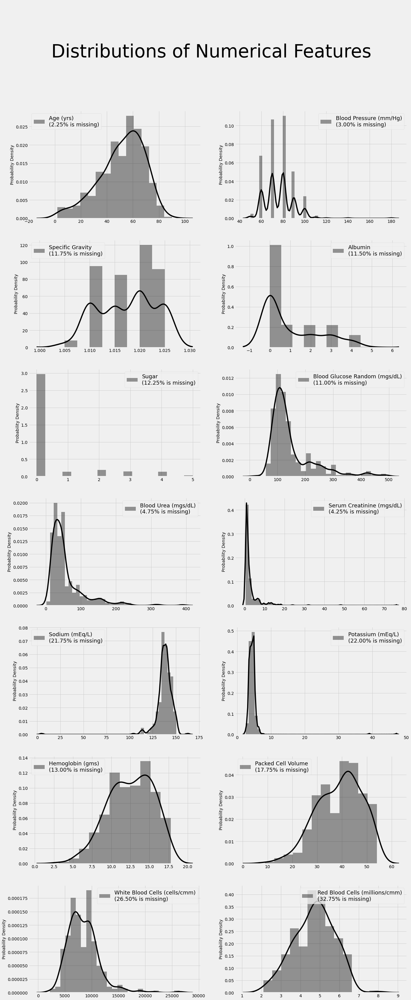

In [26]:
n_rows, n_cols = (7,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 50))
figure.suptitle('\n\nDistributions of Numerical Features', fontsize=60)

for index, column in enumerate(numeric):
    
    i,j = (index // n_cols), (index % n_cols)
    
    miss_perc="%.2f"%(100*(1-(data[column].dropna().shape[0])/data.shape[0]))
    
    collabel=column+"\n({}% is missing)".format(miss_perc)
    
    fig=sns.distplot(data[column], color="black", label=collabel, norm_hist=True,
    
    ax=axes[i,j], kde_kws={"lw":4})
    
    fig=fig.legend(loc='best', fontsize=18)
    
    axes[i,j].set_ylabel("Probability Density",fontsize='medium')
    
    axes[i,j].set_xlabel(None)

plt.show()

##### Notes:
Some features show some very distant outliers.  
Some others have discrete values, but I'll be treating them like continuous ones.  
The reason being is that these are measures of biological variables which are in reality continuous.   
Them being discrete is probably due to the method they've been measured with.  
Some features have high proportions of missing values, thus they cannot be imputed with measures of central tendency. That would distort their distributions.  
Plus, some features are very skewed while others are almost normal, some have a very distinct mode while some don't. Which means even if we didn't have so many missing values, we'd have to deal with each feature separately.  
Which would not be very enjoyable.

Let's take a look at categorical features now.

In [20]:
style.use('seaborn-darkgrid')

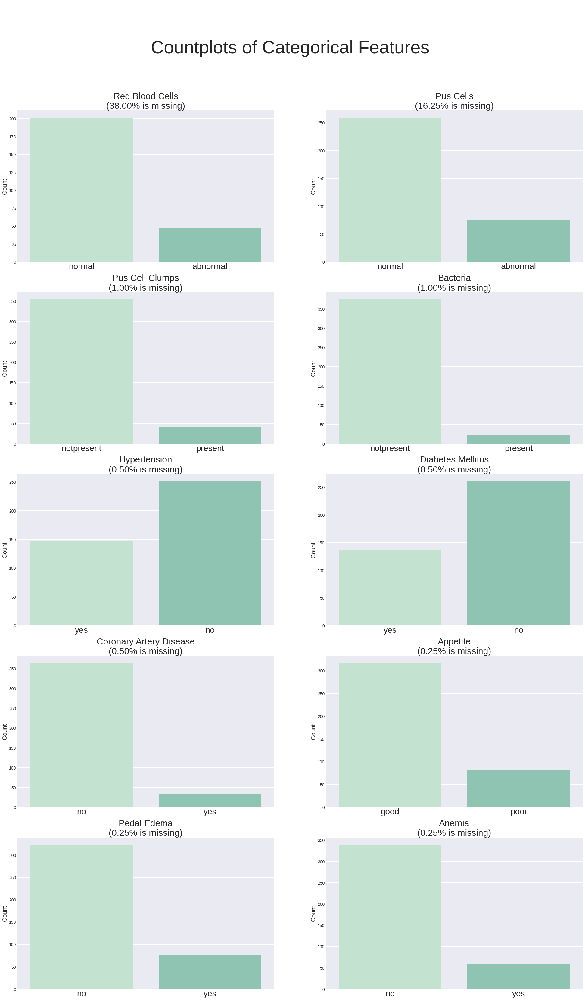

In [21]:
n_rows, n_cols = (5,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(30, 50))
figure.suptitle('\n\nCountplots of Categorical Features', fontsize=60)

for index, column in enumerate(categoricals):
    
    i,j = index // n_cols, index % n_cols
    
    miss_perc="%.2f"%(100*(1-(data[column].dropna().shape[0])/data.shape[0]))
    
    collabel=column+"\n({}% is missing)".format(miss_perc)
    
    fig = sns.countplot(x=column, data=data,label=collabel, palette=sns.cubehelix_palette(rot=-.35,light=0.85,hue=1),
    
    ax=axes[i,j])
    
    axes[i,j].set_title(collabel,fontsize=30)
    
    axes[i,j].set_xlabel(None)
    
    axes[i,j].set_ylabel("Count",fontsize=20)
    
    axes[i,j].set_xticklabels(axes[i,j].get_xticklabels(), Fontsize=28)

plt.show()

##### Notes:
Some features have very high percentages of missing values while some have almost none.  
Certain abnormalities/diseases seem relatively commun in this dataset, such as diabetes and hypertension.  
I'm no health expert, but I don't think this sample of 400 people well-represents the population of India (which is where the data was collected), nor any other population.  
This means we won't be doing any inferential statistics.  
To be honest, this project was initially intended to be a statistics project. I just wanted to practice resampling and hypothesis testing.  
But the plan kept changing.

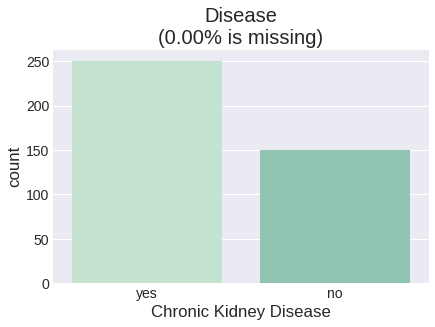

In [22]:
miss_perc="%.2f"%(100*(1-(data['Chronic Kidney Disease'].dropna().shape[0])/data.shape[0]))
    
label="Disease\n(missing:\n{}%)".format(miss_perc)
fig=sns.countplot(x=data['Chronic Kidney Disease'],label=label, palette=sns.cubehelix_palette(rot=-.35,light=0.85,hue=1))
plt.title("Disease\n({}% is missing)".format(miss_perc))
plt.show()

##### Notes:
This further shows that this dataset represents neither a country/community nor even a group of ill people.  
Yeah, I ain't doing no inferential statistics...

In [23]:
style.use('seaborn-darkgrid')

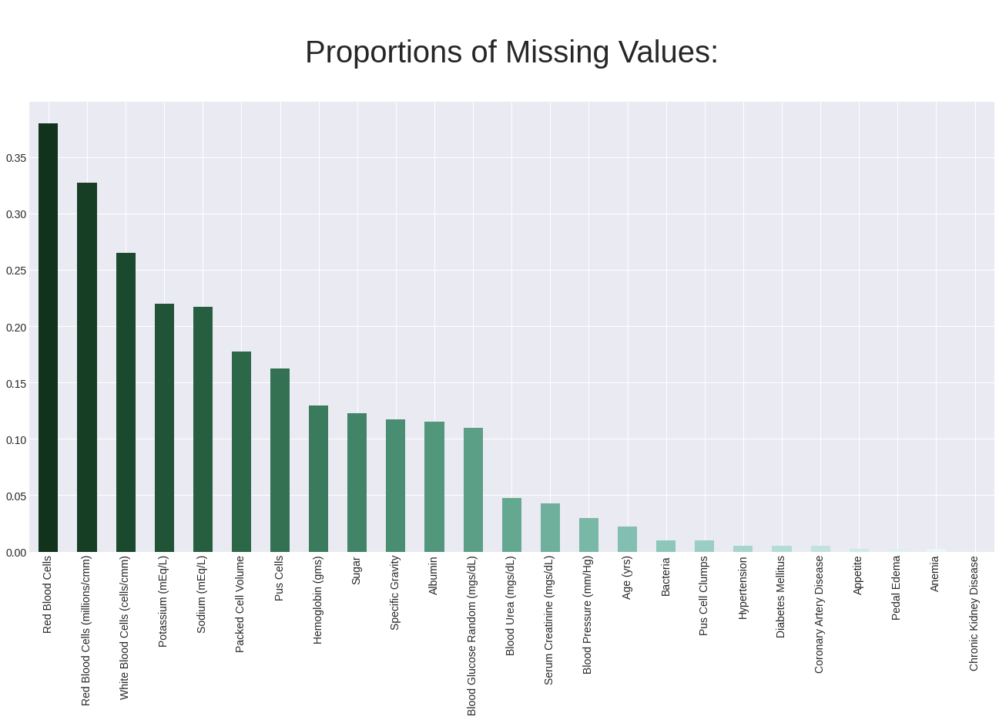

In [24]:
d=((data.isnull().sum()/data.shape[0])).sort_values(ascending=False)
d.plot(kind='bar',
       color=sns.cubehelix_palette(start=2,
                                    rot=0.15,
                                    dark=0.15,
                                    light=0.95,
                                    reverse=True,
                                    n_colors=24),
        figsize=(20,10))
plt.title("\nProportions of Missing Values:\n",fontsize=40)
plt.show()

We're going with KNN for imputation.  
But we have to encode the categorical features first.  
As said earlier, One-Hot Encoding would be perfect here as every categorical feature has only 2 values, which means we won't be increasing dimensions.  

### One-Hot Encoding

In [25]:
onehotdata=pd.get_dummies(data,drop_first=True,prefix_sep=': ')
onehotdata.head()

,Age (yrs),Blood Pressure (mm/Hg),Specific Gravity,Albumin,Sugar,Blood Glucose Random (mgs/dL),Blood Urea (mgs/dL),Serum Creatinine (mgs/dL),Sodium (mEq/L),Potassium (mEq/L),...,Pus Cells: normal,Pus Cell Clumps: present,Bacteria: present,Hypertension: yes,Diabetes Mellitus: yes,Coronary Artery Disease: yes,Appetite: poor,Pedal Edema: yes,Anemia: yes,Chronic Kidney Disease: yes
0,48.0,80.0,1.020,1.0,0.0,121.0,36.0,1.2,NaN,NaN,...,1,0,0,1,1,0,0,0,0,1
1,7.0,50.0,1.020,4.0,0.0,NaN,18.0,0.8,NaN,NaN,...,1,0,0,0,0,0,0,0,0,1
2,62.0,80.0,1.010,2.0,3.0,423.0,53.0,1.8,NaN,NaN,...,1,0,0,0,1,0,1,0,1,1
3,48.0,70.0,1.005,4.0,0.0,117.0,56.0,3.8,111.0,2.5,...,0,1,0,1,0,0,1,1,1,1
4,51.0,80.0,1.010,2.0,0.0,106.0,26.0,1.4,NaN,NaN,...,1,0,0,0,0,0,0,0,0,1


For some reason, all NaN (missing) values are now equal to 0.  
Which is a catastrophy.  
Thus, I have to turn them into NaNs again.  
I'll just loop through the original data to get their indices.  

In [26]:
names={}
for name in data.columns:
    for ohname in onehotdata.columns:
        if name+': ' in ohname and name in categoricals:
            names[name]=ohname
            for i in range(400):
                if type(data.loc[i,name])!=str:
                    if math.isnan(data.loc[i,name]):
                        onehotdata.loc[i,ohname]=data.loc[i,name]

I apologize for the layers-upon-layers of nested loops and statements.  
There probably exists a more "pythonic" way to do this.  
But that'll do the trick.  

The more complicated and complex your code is, the more it's prone to errors.  
Thus, I'll be testing what I did by counting the number of times a cell has NaN in the original data and not in the encoded one, and vice versa.  
We should get zero in every column.

In [27]:
test_oh_dt=pd.DataFrame(columns=data.columns)
for col in test_oh_dt.columns:
    if col in categoricals:
        test_oh_dt[col]=onehotdata[names[col]]
    elif col=='Chronic Kidney Disease':
        test_oh_dt[col]=onehotdata['Chronic Kidney Disease: yes']
    else:
        test_oh_dt[col]=onehotdata[col]

In [28]:
((pd.isna(data)==pd.isna(test_oh_dt))==False).sum()

Age (yrs)                         0
Blood Pressure (mm/Hg)            0
Specific Gravity                  0
Albumin                           0
Sugar                             0
Red Blood Cells                   0
Pus Cells                         0
Pus Cell Clumps                   0
Bacteria                          0
Blood Glucose Random (mgs/dL)     0
Blood Urea (mgs/dL)               0
Serum Creatinine (mgs/dL)         0
Sodium (mEq/L)                    0
Potassium (mEq/L)                 0
Hemoglobin (gms)                  0
Packed Cell Volume                0
White Blood Cells (cells/cmm)     0
Red Blood Cells (millions/cmm)    0
Hypertension                      0
Diabetes Mellitus                 0
Coronary Artery Disease           0
Appetite                          0
Pedal Edema                       0
Anemia                            0
Chronic Kidney Disease            0
dtype: int64

That went well.  
Now we should impute our data, right?  
Well, there is actually one more thing to do.  
You see, KNN measures distances (in some way), which means we have to make sure our features are on the same scale.  
If they're not, then distances will depend mostly on features with a wider spread.  
Which means the algorithm will almost only pay attention to those features.

There are many ways to do this.  
As we have a lot of missing values, I want to make sure that we deal with them in the best way possible.  
Imputed values are simulated data.  
But they too will be fed to the predictive model.  
So if the simulation doesn't represent reality that well, then our model will be learning unreal information.  
Thus, the criterea by which I will evaluate the imputed data is how much it ressembles the original data.  
Missing data won't always be identical to existing data though, especially if a lot is missing.  
But as long as it's missing at random, It shouldn't have considerably different distributions.  
So I'll be trying a few different feature transformers to scale my data, then I'll compare their results after imputation.  
I could just standardize all features but I'm worried about the outliers, so I'll be trying some non-linear transformations as well.

### Trying a Few Different Transformations

In [29]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler

The Quantile Transformer transforms a distribution into a normal or uniform one. We'll be trying both.  
The Power Transformer applies another non-linear transformation to make your data more normal-like.  
StandardScaler standardizes your features.  
RobustScaler centers data but, instead of dividing by the standard deviation, it divides by an inter-quantile range that can be specified.  
You can either specify the inter-quantile range or just leave it to default, which is [25,75].

In [30]:
NQT=QuantileTransformer(output_distribution='normal')
UQT=QuantileTransformer(output_distribution='uniform')
NSPT=PowerTransformer(standardize=False) #I'll feed its output to a normalizer and see if that makes any difference.
SPT=PowerTransformer()
RS=RobustScaler() #default
WRS=RobustScaler(quantile_range=(15,85)) # a "wider" range
SS=StandardScaler()

Transformers=[NQT,UQT,NSPT,SPT,RS,WRS,SS]
MMS=MinMaxScaler()

Pipes=[] #they're not actually pipelines, except for one,
#but initially I was going to normalize all of them, and didn't bother to change the name later
for tr in Transformers:
    p=make_pipeline(tr)
    Pipes.append(p)
Pipes[2]=make_pipeline(NSPT,MMS)

In [31]:
for pipe in Pipes:
    print(pipe)

Pipeline(steps=[('quantiletransformer',
                 QuantileTransformer(output_distribution='normal'))])
Pipeline(steps=[('quantiletransformer', QuantileTransformer())])
Pipeline(steps=[('powertransformer', PowerTransformer(standardize=False)),
                ('minmaxscaler', MinMaxScaler())])
Pipeline(steps=[('powertransformer', PowerTransformer())])
Pipeline(steps=[('robustscaler', RobustScaler())])
Pipeline(steps=[('robustscaler', RobustScaler(quantile_range=(15, 85)))])
Pipeline(steps=[('standardscaler', StandardScaler())])


Now we just apply these transformers and store their results.

In [32]:
datarrays=[]
for pipe in Pipes:
    arr=pipe.fit_transform(onehotdata)
    datarrays.append(arr)

In [33]:
dataframes=[onehotdata]
for arr in datarrays:
    df=pd.DataFrame(arr,columns=onehotdata.columns)
    dataframes.append(df)

Let's take a look at what these transformations did to our data.  
P.S: the second (blue) robustscaler is the wider one, and the first (orange) powertransformer is the normalized one.

In [34]:
categorical_feats=onehotdata.columns[14:]
numerical_feats=onehotdata.columns[:14]

In [35]:
style.use('fivethirtyeight')

In [36]:
colors=['crimson','steelblue','darkorange','darkviolet','gold','mediumblue','lime']

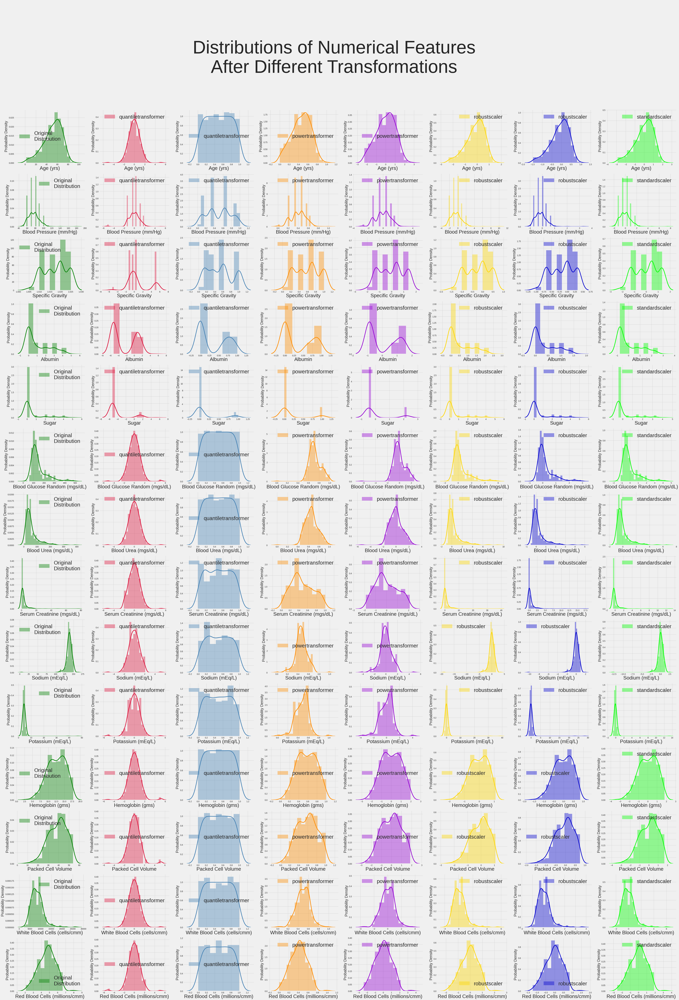

In [37]:
n_rows, n_cols = (14,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numerical Features\nAfter Different Transformations', fontsize=120)
for i in range(14):
    fig = sns.distplot(onehotdata.iloc[:,i], color="g", label='Original\nDistribution', norm_hist=True,
    
    ax=axes[i,0], kde_kws={"lw":4})
    
    fig=fig.legend(loc='best', fontsize=35)
    
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    
    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j in range(1,8):
    for i in range(14):
        label=Pipes[j-1].steps[0][0]
        
        fig = sns.distplot(dataframes[j].iloc[:,i], color=colors[j-1], label=label, norm_hist=True,

        ax=axes[i,j], kde_kws={"lw":4})
        
        fig=fig.legend(loc='best', fontsize=35)
    
        axes[i,j].set_ylabel("Probability Density",fontsize=25)
        
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=33)

plt.show()

##### Notes:
Non-linear transformations (from red to purple) don't seem to have dealt with ordinal features well.  
But you never know, I only get to judge after seeing the imputation results.  
The gaussian quantile transformer (red) piled up outliers on the edges. I don't like that. I'm quite disappointed frankly.  
Linear transformers (last three) didn't change shapes of distributions.  
Everything will be evaluated after imputation.  

In [38]:
colors2=['lightcoral','lightblue','peachpuff','plum','khaki','cornflowerblue','lightgreen']

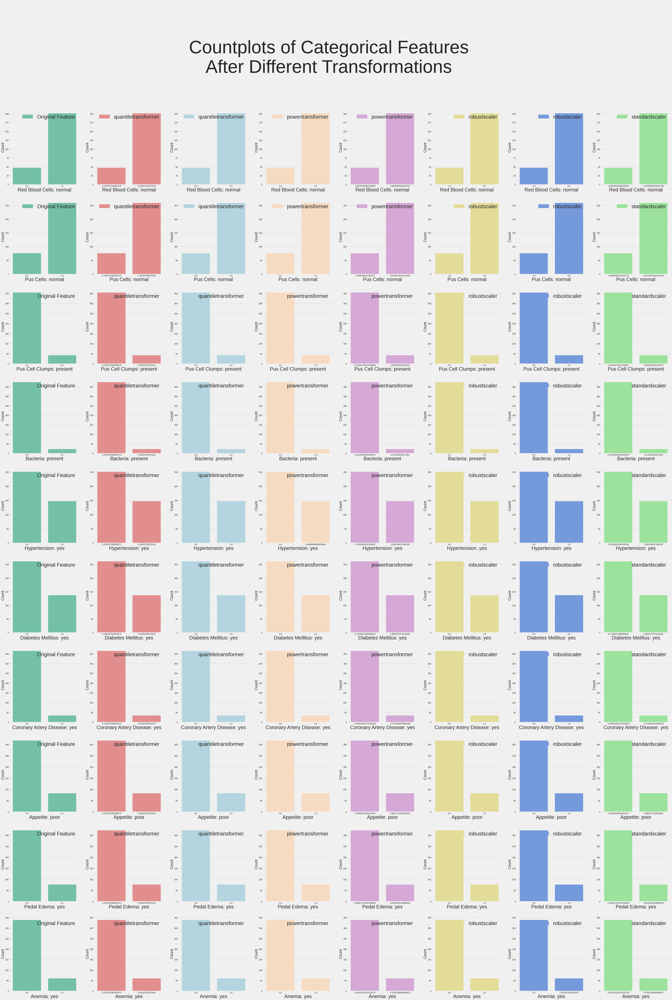

In [39]:
n_rows, n_cols = (10,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nCountplots of Categorical Features\nAfter Different Transformations', fontsize=120)
for i in range(10):
    g = sns.countplot(onehotdata.iloc[:,i+14], color="mediumaquamarine", label="Original Feature",
    
    ax=axes[i,0])
    
    g=g.legend(loc='best', fontsize=35)
    
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    
    axes[i,0].set_ylabel("Count",fontsize=25)

for j in range(1,8):
    for i in range(10):
        label=Pipes[j-1].steps[0][0]
        
        g = sns.countplot(dataframes[j].iloc[:,i+14], color=colors2[j-1], label=label,

        ax=axes[i,j])
        
        g=g.legend(loc='best', fontsize=35)
    
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=33)
    
        axes[i,j].set_ylabel("Count",fontsize=25)

plt.show()

##### Notes:
Apparently, these didn't change.  
That's about it I guess.

### Imputation

In [40]:
from sklearn.impute import KNNImputer

In [41]:
knnimp=KNNImputer(weights='distance', n_neighbors=8)

In [42]:
rrr=[onehotdata.to_numpy()]
for dfi in range(1,len(dataframes)):
    rrr.append(knnimp.fit_transform(dataframes[dfi]))

In [43]:
arrs=[rrr[0]]
for i in range(1,len(rrr)):
    arrs.append(Pipes[i-1].inverse_transform(rrr[i]))

In [44]:
impdf=[]
for i in range(len(arrs)):
    impdf.append(pd.DataFrame(arrs[i],columns=onehotdata.columns))

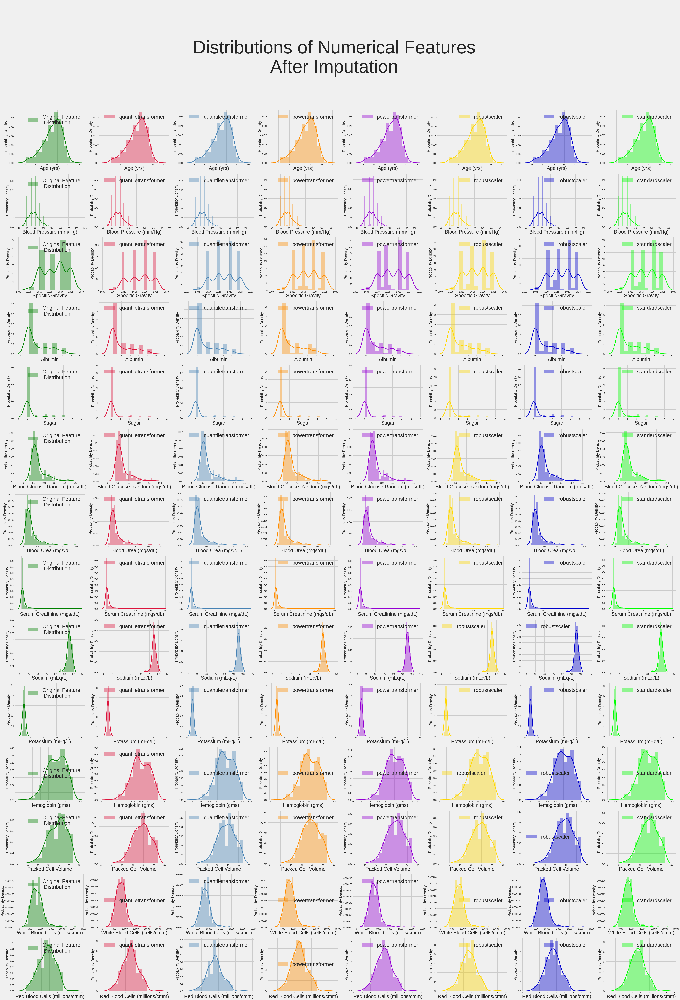

In [45]:
n_rows, n_cols = (14,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numerical Features\nAfter Imputation', fontsize=120)
for i in range(14):
    fig = sns.distplot(onehotdata.iloc[:,i], color="g", label='Original Feature\n Distribution', norm_hist=True,
    
    ax=axes[i,0], kde_kws={"lw":4})
    
    fig=fig.legend(loc='best', fontsize=35)
    
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    
    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j in range(1,8):
    for i in range(14):
        label=Pipes[j-1].steps[0][0]
        
        fig = sns.distplot(impdf[j].iloc[:,i], color=colors[j-1], label=label, norm_hist=True,

        ax=axes[i,j], kde_kws={"lw":4})
        
        fig=fig.legend(loc='best', fontsize=35)
    
        axes[i,j].set_ylabel("Probability Density",fontsize=25)
        
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=33)

plt.show()

##### Notes:
Both quantile transformers did a very decent job (despite the piles of outliers mentionned earlier)  
The unstandardized, normalized powertransformer (orange) performed quite awfully.  
The Standardized power transformer (purple) is, in contrast, quite decent.  
Linear transformers have almost identical results.  Good ones nonetheless.  

In [47]:
impdf[6].iloc[:,15].unique()

array([1.        , 0.        , 0.63160166, 0.88607326, 0.61387208,
       0.75862137, 0.70806966, 0.86137172, 0.63119148, 0.89543788,
       0.74179684, 0.77161848, 0.61793009, 0.82398101, 0.75406756,
       0.36706328, 0.5835219 , 0.74235729, 0.87901676, 0.64341621,
       0.36860117, 0.78812957, 0.45736785, 0.74810413, 0.73289946,
       0.88144675, 0.75573017, 0.51257409, 0.89459771, 0.2498657 ,
       0.89557894, 0.7636394 , 0.75378168, 0.89316823, 0.76532431,
       0.83814399, 0.5902046 , 0.88189939, 0.6411361 , 0.74195041,
       0.82964032, 0.86885068, 0.63890626, 0.48569735, 0.88566203,
       0.77744959, 0.63198161, 0.73726093, 0.61095653, 0.62328647,
       0.67830806, 0.71205989, 0.78204737, 0.40201877, 0.48129177])

All we have to do is use 0.5 as a threshhold. Everything above becomes 1, everything under becomes 0.

In [48]:
test=impdf.copy()
for j in range(1,8):
    dat=test[j]
    for i in range(14,25):
        col=dat.iloc[:,i]
        for k in range(400):
            if col[k]>=0.5:
                col[k]=1
            else:
                col[k]=0

In [49]:
test[6].iloc[:,16].unique()

array([0., 1.])

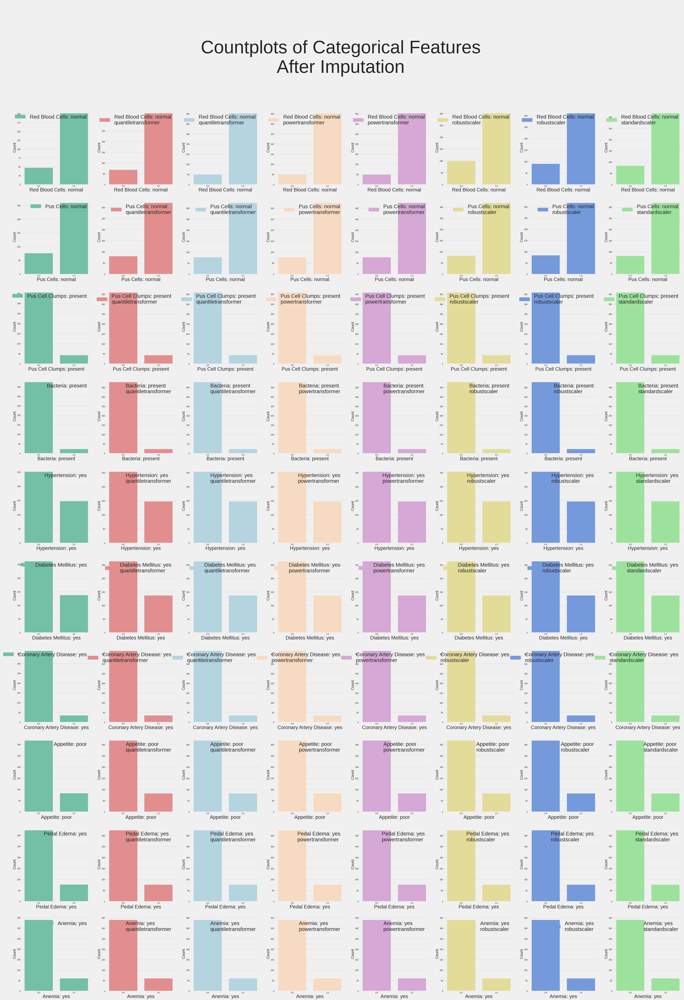

In [50]:
n_rows, n_cols = (10,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nCountplots of Categorical Features\nAfter Imputation', fontsize=120)
for i in range(10):
    g = sns.countplot(onehotdata.iloc[:,i+14], color="mediumaquamarine", label=categorical_feats[i],
    
    ax=axes[i,0])
    
    g=g.legend(loc='best', fontsize=35)
    
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    
    axes[i,0].set_ylabel("Count",fontsize=25)

for j in range(1,8):
    for i in range(10):
        label=categorical_feats[i]+'\n'+Pipes[j-1].steps[0][0]
        
        g = sns.countplot(test[j].iloc[:,i+14], color=colors2[j-1], label=label,

        ax=axes[i,j])
        
        g=g.legend(loc='best', fontsize=35)
        
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=33)
    
        axes[i,j].set_ylabel("Count",fontsize=25)

plt.show()

##### Notes:
The StandardScaler is the only one that kept the distribution of the red blood cells feature exactly as it is.  
RobustScalers slightly increased the proportion of "0" while non-linear transformers decreased it, especially the uniform QuantileTransformer.  
But it's the feature with most missing values at around 38%, so you never know...  

Let's take a closer look at what happened to features with many missing values, as those are the ones for which all of this was done.  
I'll pick three transformers which I think did a good job at keeping feature distributions:  
Gaussian QuantileTransformer (red)  
"Wide" RobustScaler (blue)  
and StandardScaler (green)  
The uniform QuantileTransformer did a decent job as well but oh well, I want to make a bigger graph ie a not-so-crammed one. So I'll be going with just three.  
Now the ones I picked are not necessarily better, and the only way to know is to try them with the same machine learning models and compare results.  
Or we can take a dataset, empty a few cells, impute with different techniques then compare results with the original data.

In [51]:
impdf=test

In [56]:
onehotdata=impdf[1].copy()

In [57]:
onehotdata.dropna().shape

(400, 25)

We have no more missing values

# Exploratory Data Analysis

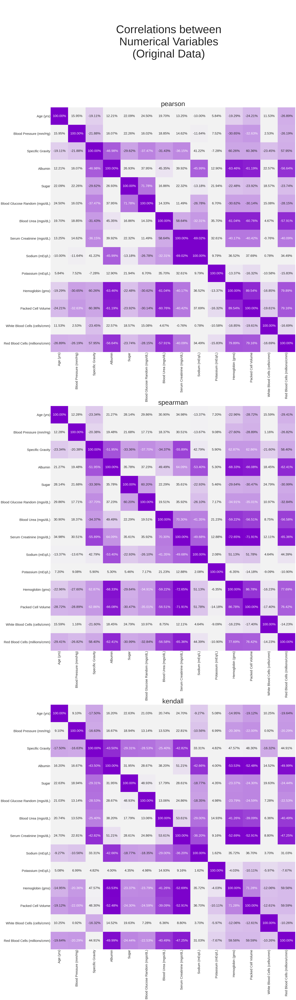

In [63]:
numericdat=data.drop(categoricals, axis=1, inplace=False)

figure, axes = plt.subplots(nrows=3,figsize=(35, 130))
figure.suptitle('\n\nCorrelations between\nNumerical Variables\n(Original Data)', fontsize=100)

corrs=['pearson','spearman','kendall']
for row in range(3):
    sns.heatmap(numericdat.corr(corrs[row]),
                cmap=sns.diverging_palette(280, 280, s=100, l=35, as_cmap=True,sep=80),
                square=True,
                annot=True,
                annot_kws={'fontsize':30},
                fmt='.2%',
                ax=axes[row],
                cbar=False)
    axes[row].set_title(corrs[row],fontsize=60)
    axes[row].set_yticklabels(axes[row].get_yticklabels(),fontsize=30)
    axes[row].set_xticklabels(axes[row].get_xticklabels(),fontsize=30)

##### Notes:
Same thing as with categorical features: practically no correlations.  

In [66]:
colors3=['deepskyblue','turquoise','mediumspringgreen','turquoise']

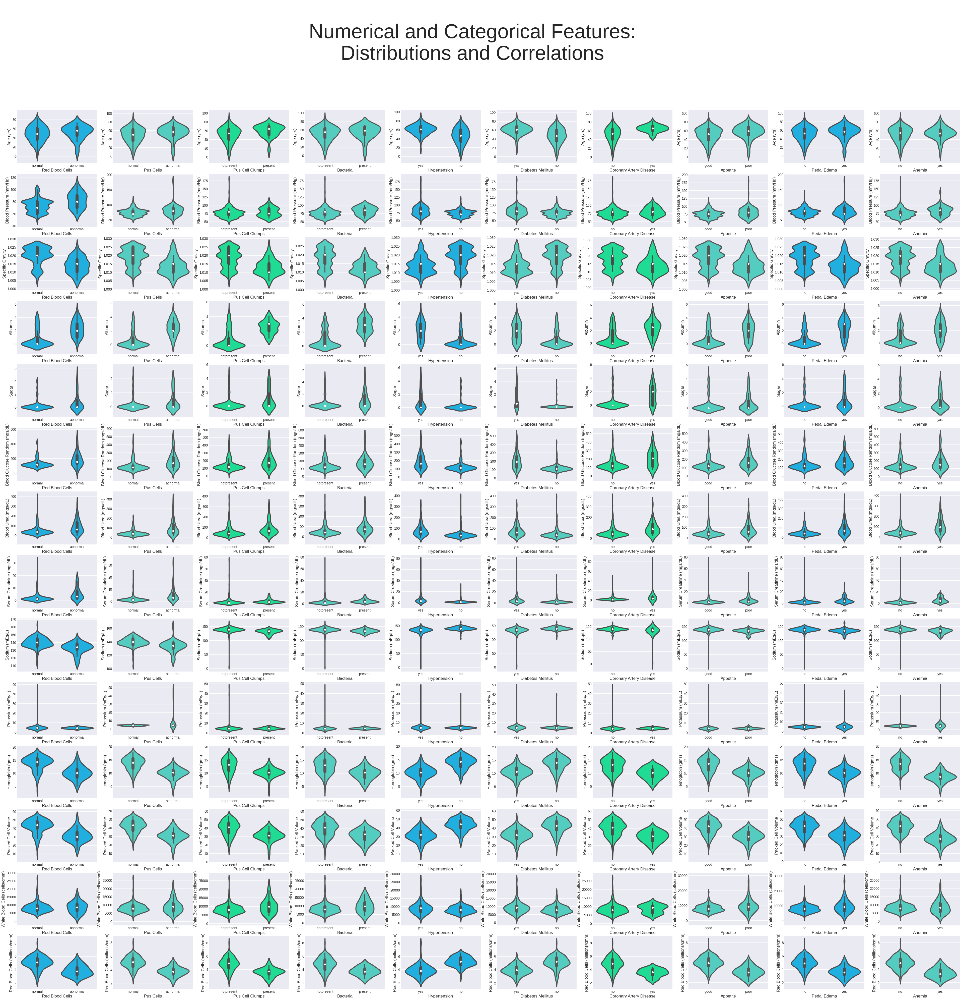

In [67]:
n_rows, n_cols = (14,10)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(60, 60))
figure.suptitle('\nNumerical and Categorical Features:\nDistributions and Correlations', fontsize=80)

for i in range(14):
    for j in range(10):
        graph=sns.violinplot(y=numeric[i],x=categoricals[j],data=data,color=colors3[j%4],ax=axes[i,j])
plt.show()

##### Notes:
Same as before, there's a lot to test.  
Means don't seem to differ that much by category for certain features, but the difference of spreads is quite considerable.  
Categories don't have the same distributions for some features.  

# Clustering & Prediction

### Prediction Using K-Means Clustering

Ever thought about classification by clustering ?  
"How?", I hear you ask.    
Well, if every cluster corresponds to a single category, then we've got a predictive model.  
Quite simple, isn't it?  
Plus, if it works, we would get different clusters in each category.  
Which would be quite enjoyable to analyze.  

So how many clusters should we make?  
We can make an approximate guess by measuring inertia for different numbers of clusters.  
If we find an elbow point then that is quite likely to be the best choice.

P.S: Just like KNN, K-Means is sensitive to feature scales.  
Thus we have to, again, put features on the same scale.  
As I explained earlier, we'll be using sklearn's StandardScaler.

In [68]:
X=onehotdata.drop("Chronic Kidney Disease: yes",axis=1,inplace=False)
Y=onehotdata["Chronic Kidney Disease: yes"]

In [69]:
full_scaled_data=SS.fit_transform(onehotdata)
scaled_data=SS.fit_transform(X)

In [83]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(scaled_data, Y, test_size=0.4, random_state=12)

### Evaluating A Few Other Models

In [88]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [89]:
SVM_RBF=SVC()
    
SVM_Poly2=SVC(kernel='poly',degree=2)
    
SVM_Poly3=SVC(kernel='poly',degree=3)

KNN3=KNeighborsClassifier(n_neighbors=3,weights='distance')

KNN8=KNeighborsClassifier(n_neighbors=8,weights='distance')

KNN15=KNeighborsClassifier(n_neighbors=15,weights='distance')

Naive_Bayes=GaussianNB()

LogReg=LogisticRegression()

Tree=DecisionTreeClassifier()

Forest=RandomForestClassifier()

models=[SVM_RBF,SVM_Poly2,SVM_Poly3,KNN3,KNN8,KNN15,Naive_Bayes,LogReg,Tree,Forest]

names=["SVM_RBF","SVM_Poly2","SVM_Poly3","Weighted 3NearestNeighbors","Weighted 8NearestNeighbors",
       "Weighted 15NearestNeighbors","Naive Bayes","Logistic Regression","Decision Tree","Random Forest"]

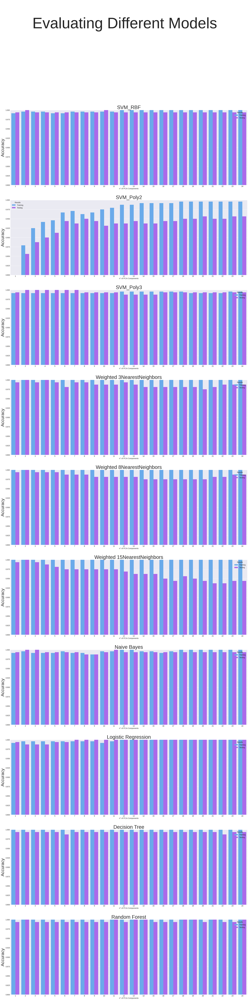

In [90]:
n_rows, n_cols= 10,1

figure, axes = plt.subplots(nrows=n_rows,ncols= n_cols, figsize=(30, 120))

figure.suptitle('\nEvaluating Different Models', fontsize=120)



tr_mask = np.empty(shape=(24,1),dtype="object")
    
ts_mask = np.empty(shape=(24,1),dtype="object")

for i in range(24):
    tr_mask[i]="Training"
    ts_mask[i]="Testing"

mask = np.vstack((tr_mask,ts_mask))

mask=mask.reshape((48,))

cmps=[i for i in range(1,25)] * 2


for index in range(10):
    
    pca_tr_acc=[]
    
    pca_ts_acc=[]
    
    
    for n_comps in range(1,25):
        
        model=models[index]
        
        pca=PCA(n_components=n_comps)
        
        pca_model=make_pipeline(pca,model)
        
        pca_model.fit(X_train,Y_train)
        
        y_tr_pred= pca_model.predict(X_train)
        
        pca_tr_acc.append(accuracy_score(y_tr_pred,Y_train))
        
        y_ts_pred=pca_model.predict(X_test)
        
        pca_ts_acc.append(accuracy_score(y_ts_pred,Y_test))
        
    
    model_data = pd.DataFrame()
    
    model_data["PCA"] = pca_tr_acc + pca_ts_acc
        
    model_data["Results"] = mask
    
    sns.barplot(x=cmps, y="PCA", hue="Results", data=model_data, palette='cool', ax=axes[index]).set(ylim=(0.8,1))
    
    axes[index].set_title(names[index],fontsize=40)
    
    axes[index].set_xlabel("n° of PCA Components",fontsize=15)
    
    axes[index].set_ylabel("Accuracy",fontsize=35)
    
    axes[index].set_xticklabels(axes[index].get_xticklabels(),fontsize=15)
    
    
plt.show()

##### Notes:
PCA didn't make any significant difference except for the degree-2 polynomial SVM, which performed awfully anyways.  
Best results for SVM were with the polynomial kernel with degree 3.  
Naive Bayes performed really well.  
I would say this is due to the fact that there isn't much correlation between features.  
Naive Bayes assumes that features are independent, which they pretty much are.  
Logistic Regression seems to have no variance with many components.  
The random forest also has zero variance for certain values of n_components.  
KNN has a higher variance compared than others, but it's still quite decent for the most part.  
All algorithms produced good results other than the degree-2 polynomial SVC.

### Neural Networks

So I'll be trying a small neural network with one hidden layer containing 4 neurons, and a bigger one with 3 hidden layers and lots of neurons.

In [91]:
import tensorflow
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical

In [92]:
early_stopping_monitor = EarlyStopping(patience=5, monitor='accuracy')
Y_net = to_categorical(Y)

In [93]:
pca_tr_acc_1=[]
    
pca_ts_acc_1=[]


pca_tr_acc_2=[]
    
pca_ts_acc_2=[]


for i in range(1,25):
    
    pca=PCA(n_components=i)
    
    X_pca=pca.fit_transform(scaled_data)
    
    X_pca_train, X_pca_test, Y_train, Y_test = train_test_split(X_pca, Y_net, test_size=0.25, random_state=12)
    
    #little net
    net1= Sequential()
    
    net1.add(Dense(4, activation='relu', input_shape = (i,)))
    
    net1.add(Dense(2, activation='softmax'))
    
    net1.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
    
    net1.fit(X_pca_train, Y_train, epochs=50, callbacks=[early_stopping_monitor], verbose=0)
    
    y_tr_pred=net1.predict(X_pca_train)
    
    pca_tr_acc_1.append(accuracy_score(np.argmax(y_tr_pred, axis=1),Y_train[:,1]))
    
    y_ts_pred=net1.predict(X_pca_test)
    
    pca_ts_acc_1.append(accuracy_score(np.argmax(y_ts_pred, axis=1),Y_test[:,1]))
    
    
    
    #big net
    net2= Sequential()
    
    net2.add(Dense(50, activation='relu', input_shape = (i,)))
    
    net2.add(Dense(30, activation='relu'))
    
    net2.add(Dense(20, activation='relu'))
    
    net2.add(Dense(10, activation='relu'))
    
    net2.add(Dense(2, activation='softmax'))
    
    net2.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
    
    net2.fit(X_pca_train, Y_train, epochs=100, callbacks=[early_stopping_monitor], verbose=0)
    
    y_tr_pred=net2.predict(X_pca_train)
    
    pca_tr_acc_2.append(accuracy_score(np.argmax(y_tr_pred, axis=1),Y_train[:,1]))
    
    y_ts_pred=net2.predict(X_pca_test)
    
    pca_ts_acc_2.append(accuracy_score(np.argmax(y_ts_pred, axis=1),Y_test[:,1]))

In [94]:
tr_mask = np.empty(shape=(24,1),dtype="object")
    
ts_mask = np.empty(shape=(24,1),dtype="object")

for i in range(24):
    tr_mask[i]="Training"
    ts_mask[i]="Testing"

mask = np.vstack((tr_mask,ts_mask))

mask=mask.reshape((48,))

cmps=[i for i in range(1,25)] * 2


net1_data = pd.DataFrame()
    
net1_data["PCA"] = pca_tr_acc_1 + pca_ts_acc_1

net1_data["Results"] = mask


net2_data = pd.DataFrame()
    
net2_data["PCA"] = pca_tr_acc_2 + pca_ts_acc_2

net2_data["Results"] = mask

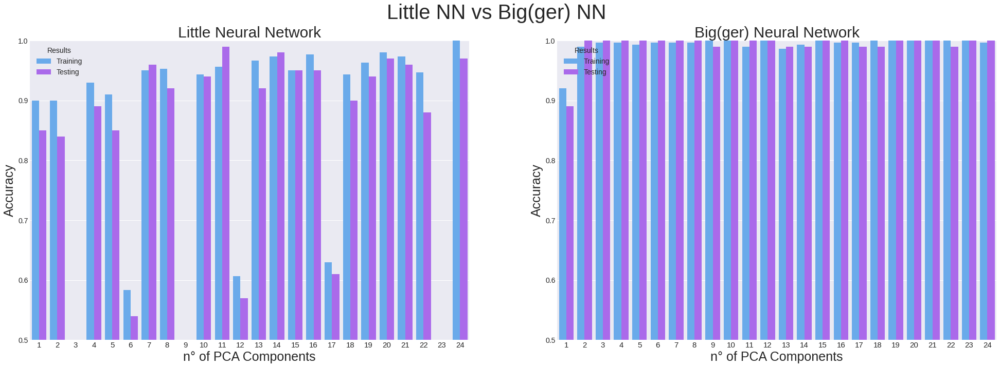

In [95]:
n_rows, n_cols= 1,2

figure, axes = plt.subplots(nrows=n_rows,ncols= n_cols, figsize=(30, 10))

figure.suptitle('Little NN vs Big(ger) NN', fontsize=40)



graph1=sns.barplot(x=cmps, y="PCA", hue="Results", data=net1_data, palette='cool', ax=axes[0]).set(ylim=(0.5,1))

axes[0].set_title("Little Neural Network",fontsize=30)

axes[0].set_xlabel("n° of PCA Components",fontsize=25)

axes[0].set_ylabel("Accuracy",fontsize=25)

axes[0].set_xticklabels(axes[0].get_xticklabels(),fontsize=15)



graph2=sns.barplot(x=cmps, y="PCA", hue="Results", data=net2_data, palette='cool', ax=axes[1]).set(ylim=(0.5,1))

axes[1].set_title("Big(ger) Neural Network",fontsize=30)

axes[1].set_xlabel("n° of PCA Components",fontsize=25)

axes[1].set_ylabel("Accuracy",fontsize=25)

axes[1].set_xticklabels(axes[1].get_xticklabels(),fontsize=15)

plt.show()

##### Notes:
Obviously, the bigger network had better and more consistent results.  
With certain values of n_components there seems to be no variance.  
I don't see why the smaller network gave such inconsistent results; accuracy changes drastically for certain values of n_components.